In [1]:

from keras.models import load_model
from numpy import load
from numpy import vstack
from matplotlib import pyplot
from numpy.random import randint
from tensorflow_addons.layers import InstanceNormalization
from keras.layers import BatchNormalization
from keras.optimizers import Adam
import tensorflow as tf
import numpy as np
import skimage.metrics as metrics
import matplotlib.pyplot as plt

c:\Users\Wendell\anaconda3\envs\tf210\lib\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [20]:
# load and prepare training images
def load_real_samples(filename):
    # load the dataset
    data = load(filename)
    X1, X2 = data['arr_0'], data['arr_1']
    # scale from [0,255] to [-1,1]
    X1 = (X1 - 127.5) / 127.5
    X2 = (X2 - 127.5) / 127.5
    return [X1, X2]

In [24]:
# select a random sample of images from the dataset
def select_sample(dataset, n_samples):
    # choose random instances
    ix = randint(50, dataset.shape[0], n_samples)
    # retrieve selected images
    X = dataset[ix]
    return X


In [22]:
# plot the image, the translation, and the reconstruction
def show_plot(imagesX, imagesY1, imagesY2):
    images = vstack((imagesX, imagesY1, imagesY2))
    titles = ['Real', 'Generated', 'Reconstructed']
    # scale from [-1,1] to [0,1]
    images = (images + 1) / 2.0
    # plot images row by row
    for i in range(len(images)):
        # define subplot
        pyplot.subplot(1, len(images), 1 + i)
        # turn off axis
        pyplot.axis('off')
        # plot raw pixel data
        pyplot.imshow(images[i])
        # title
        pyplot.title(titles[i])
    pyplot.show()

In [69]:
# load dataset
A_data, B_data = load_real_samples('self2anime.npz')
print('Loaded', A_data.shape, B_data.shape)

# load the models

model_AtoB = load_model('g_model_AtoB_136175.h5')
model_BtoA = load_model('g_model_BtoA_136175.h5')

Loaded (2095, 256, 256, 3) (2095, 256, 256, 3)


c:\Users\Wendell\anaconda3\envs\tf210\lib\site-packages\keras\initializers\initializers_v2.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


1/1 [==============================] - 0s 14ms/step


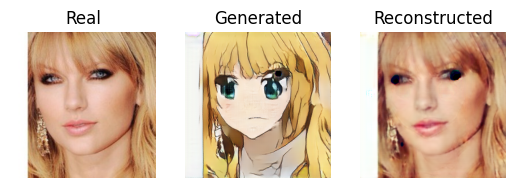

SSIM A->B:  0.9831945
SSIM B->A:  0.9833768
1/1 [==============================] - 0s 13ms/step


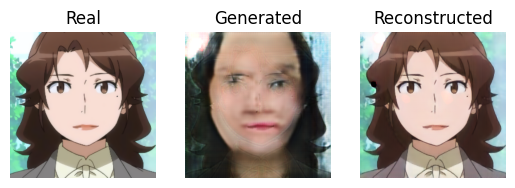

SSIM B->A:  0.9577808
SSIM A->B:  0.961307


In [71]:
import numpy as np
from skimage.metrics import structural_similarity as ssim
from keras.layers import BatchNormalization

def calculate_ssim(image1, image2, win_size=3):
    channel_axis = 0  # Set the channel axis if working with multichannel images
    # Calculate SSIM
    ssim_score = ssim(image1, image2, win_size=win_size, multichannel=True, data_range=255, channel_axis=channel_axis)
    return ssim_score

# Replace InstanceNormalization with BatchNormalization
for layer in model_AtoB.layers:
    if isinstance(layer, BatchNormalization):
        layer.trainable = False

for layer in model_BtoA.layers:
    if isinstance(layer, BatchNormalization):
        layer.trainable = False

# Plot A->B->A
A_real = select_sample(A_data, 1)
B_generated = model_AtoB.predict(A_real)
A_reconstructed = model_BtoA.predict(B_generated)

# Calculate SSIM
ssim_AtoB = calculate_ssim(A_real, B_generated, win_size=3)
ssim_BtoA = calculate_ssim(B_generated, A_reconstructed, win_size=3)

# Plot A->B->A with SSIM value
show_plot(A_real, B_generated, A_reconstructed)
print("SSIM A->B: ", ssim_AtoB)
print("SSIM B->A: ", ssim_BtoA)

# Plot B->A->B
B_real = select_sample(B_data, 1)
A_generated = model_BtoA.predict(B_real)
B_reconstructed = model_AtoB.predict(A_generated)

# Calculate SSIM
ssim_BtoA = calculate_ssim(B_real, A_generated, win_size=3)
ssim_AtoB = calculate_ssim(A_generated, B_reconstructed, win_size=3)

# Plot B->A->B with SSIM value
show_plot(B_real, A_generated, B_reconstructed)
print("SSIM B->A: ", ssim_BtoA)
print("SSIM A->B: ", ssim_AtoB)


1/1 [==============================] - 0s 13ms/step


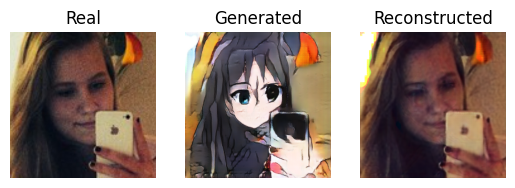

1/1 [==============================] - 0s 15ms/step


C:\Users\Wendell\AppData\Local\Temp\ipykernel_67900\2691497774.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  pyplot.subplot(1, len(images), 1 + i)


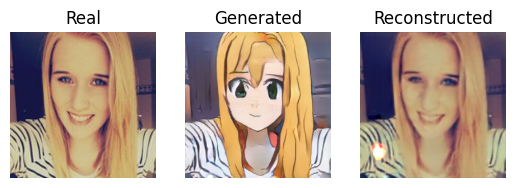

1/1 [==============================] - 0s 13ms/step


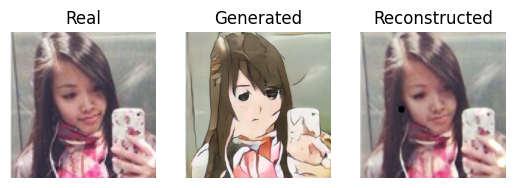

1/1 [==============================] - 0s 13ms/step


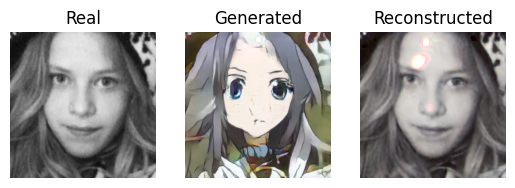

1/1 [==============================] - 0s 14ms/step


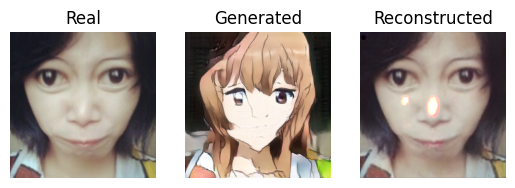

1/1 [==============================] - 0s 13ms/step


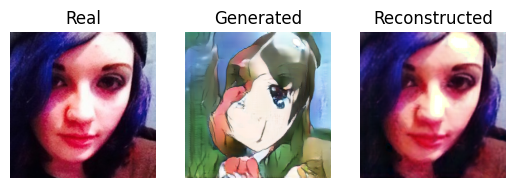

1/1 [==============================] - 0s 64ms/step


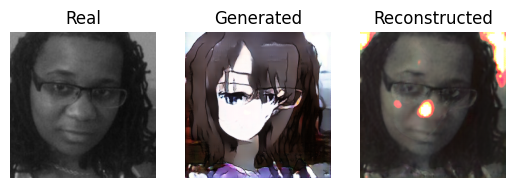

1/1 [==============================] - 0s 12ms/step


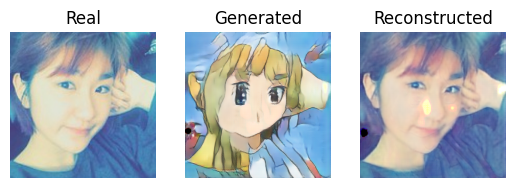

1/1 [==============================] - 0s 13ms/step


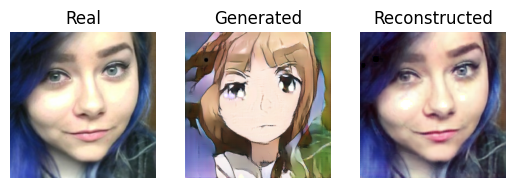

1/1 [==============================] - 0s 13ms/step


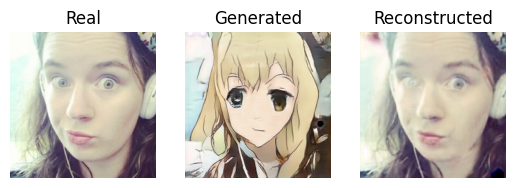

1/1 [==============================] - 0s 14ms/step


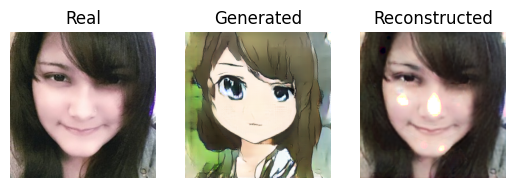

1/1 [==============================] - 0s 13ms/step


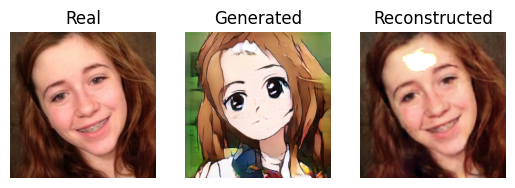

1/1 [==============================] - 0s 12ms/step


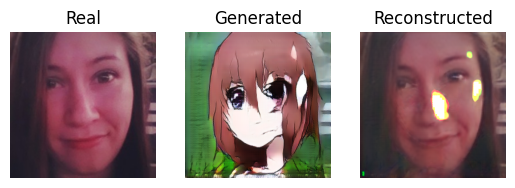

1/1 [==============================] - 0s 12ms/step


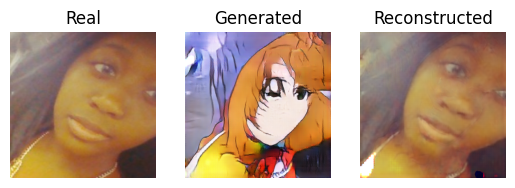

1/1 [==============================] - 0s 13ms/step


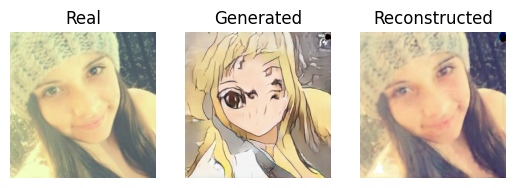

1/1 [==============================] - 0s 16ms/step


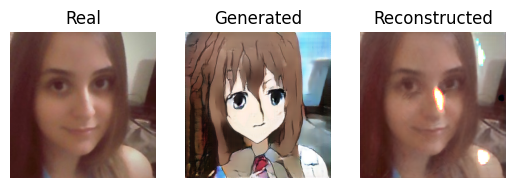

1/1 [==============================] - 0s 12ms/step


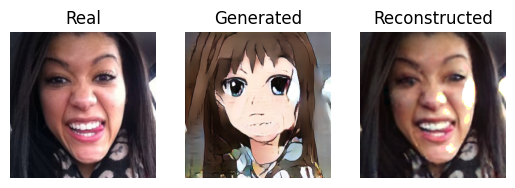

1/1 [==============================] - 0s 13ms/step


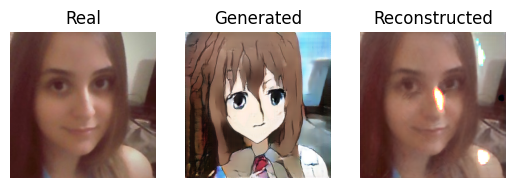

1/1 [==============================] - 0s 13ms/step


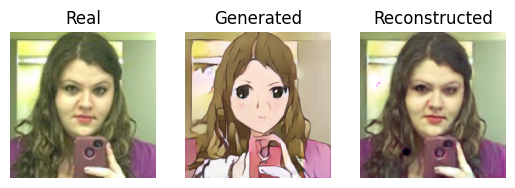

1/1 [==============================] - 0s 13ms/step


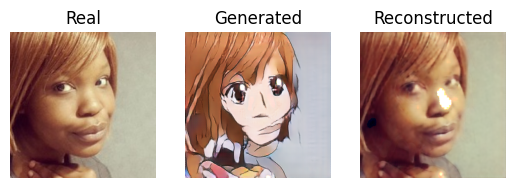

1/1 [==============================] - 0s 13ms/step


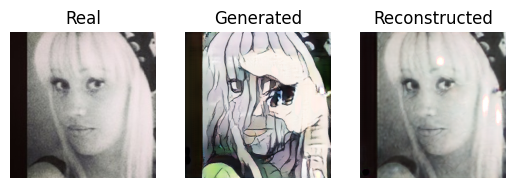

1/1 [==============================] - 0s 13ms/step


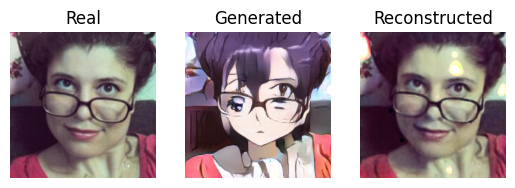

1/1 [==============================] - 0s 12ms/step


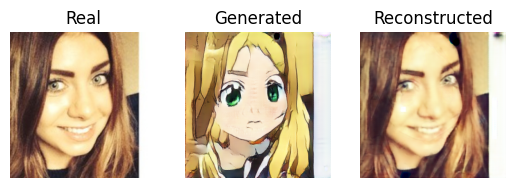

1/1 [==============================] - 0s 29ms/step


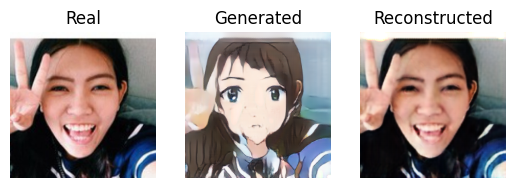

1/1 [==============================] - 0s 12ms/step


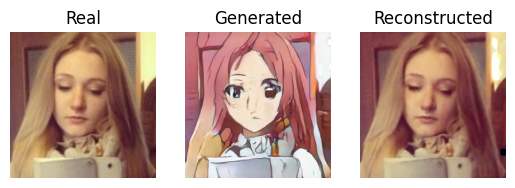

1/1 [==============================] - 0s 12ms/step


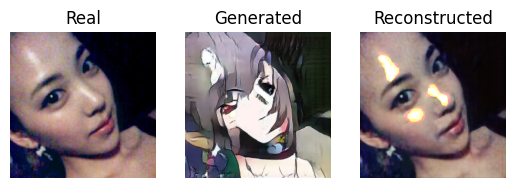

1/1 [==============================] - 0s 24ms/step


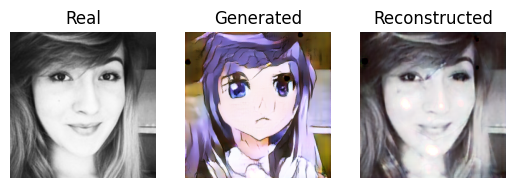

1/1 [==============================] - 0s 19ms/step


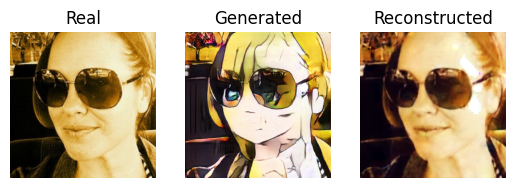

1/1 [==============================] - 0s 13ms/step


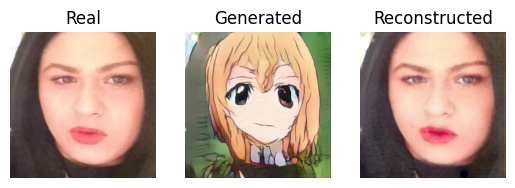

1/1 [==============================] - 0s 13ms/step


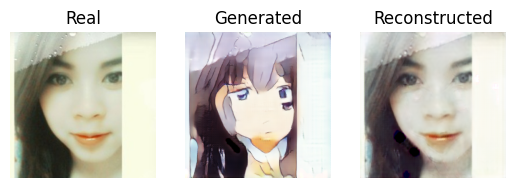

1/1 [==============================] - 0s 12ms/step


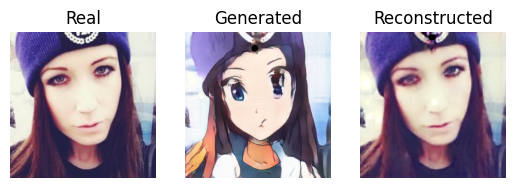

1/1 [==============================] - 0s 12ms/step


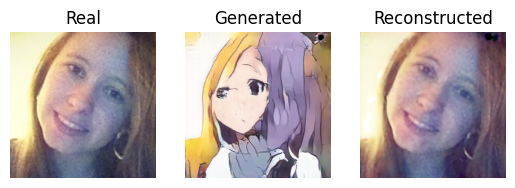

1/1 [==============================] - 0s 22ms/step


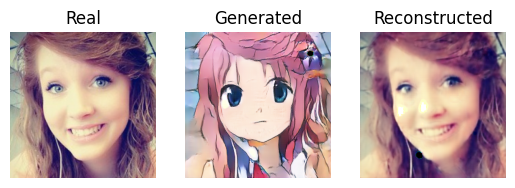

1/1 [==============================] - 0s 12ms/step


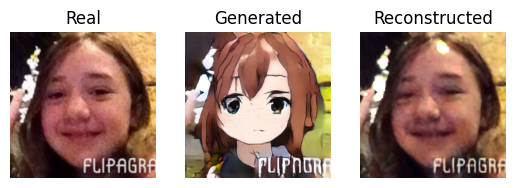

1/1 [==============================] - 0s 51ms/step


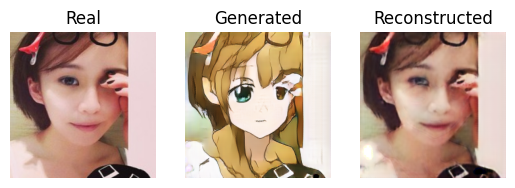

1/1 [==============================] - 0s 13ms/step


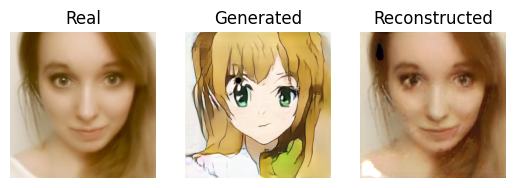

1/1 [==============================] - 0s 12ms/step


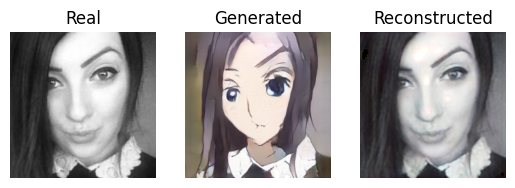

1/1 [==============================] - 0s 12ms/step


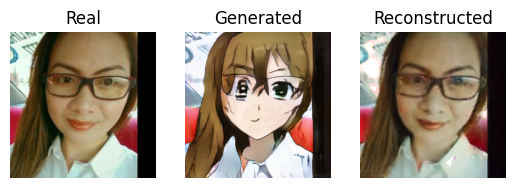

1/1 [==============================] - 0s 12ms/step


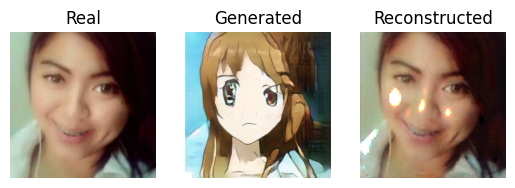

1/1 [==============================] - 0s 13ms/step


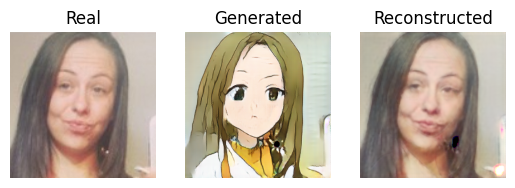

1/1 [==============================] - 0s 13ms/step


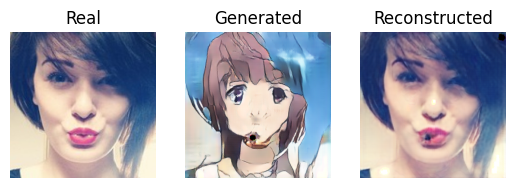

1/1 [==============================] - 0s 13ms/step


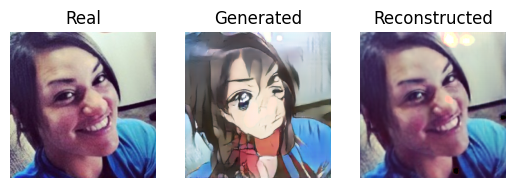

1/1 [==============================] - 0s 12ms/step


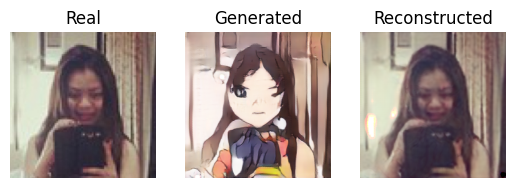

1/1 [==============================] - 0s 12ms/step


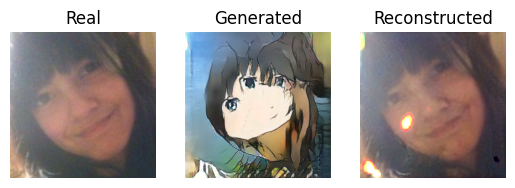

1/1 [==============================] - 0s 13ms/step


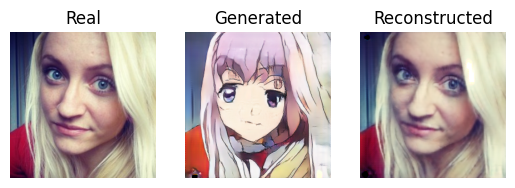

1/1 [==============================] - 0s 12ms/step


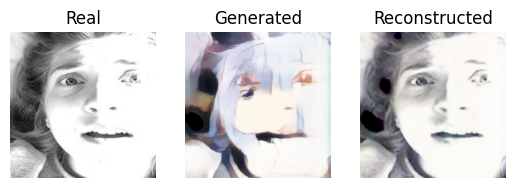

1/1 [==============================] - 0s 12ms/step


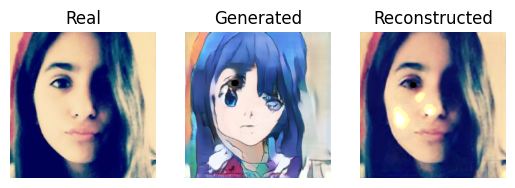

1/1 [==============================] - 0s 13ms/step


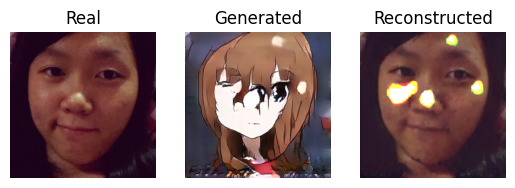

1/1 [==============================] - 0s 13ms/step


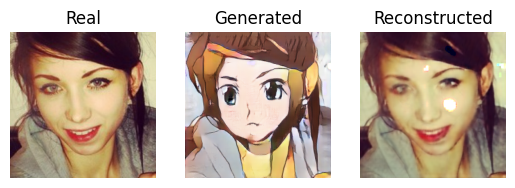

1/1 [==============================] - 0s 14ms/step


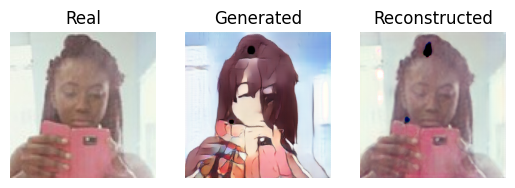

1/1 [==============================] - 0s 12ms/step


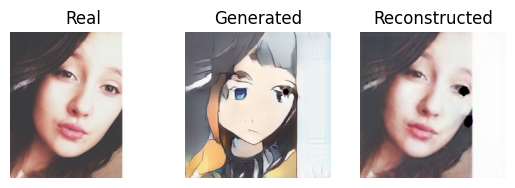

1/1 [==============================] - 0s 12ms/step


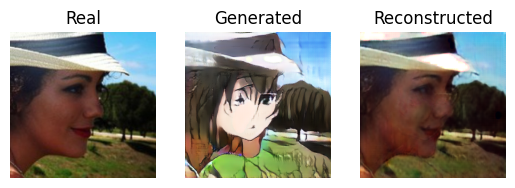

1/1 [==============================] - 0s 24ms/step


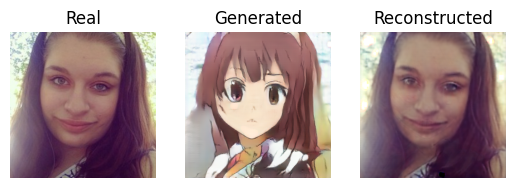

1/1 [==============================] - 0s 15ms/step


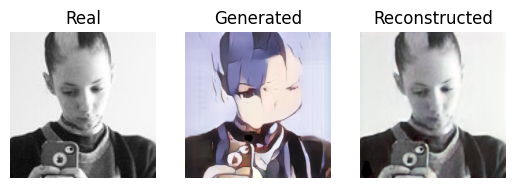

1/1 [==============================] - 0s 14ms/step


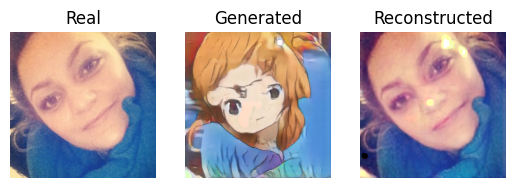

1/1 [==============================] - 0s 12ms/step


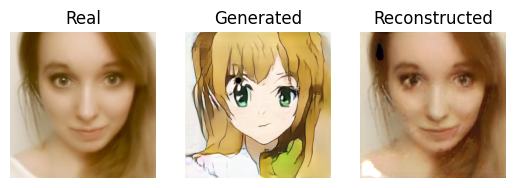

1/1 [==============================] - 0s 13ms/step


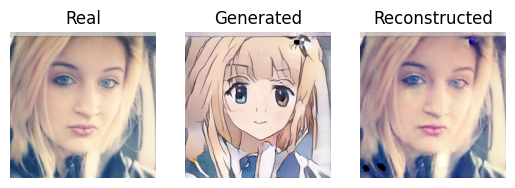

1/1 [==============================] - 0s 25ms/step


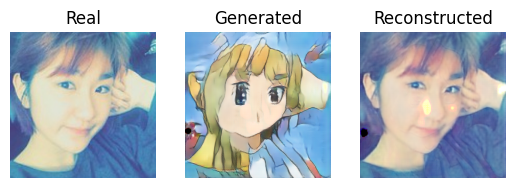

1/1 [==============================] - 0s 40ms/step


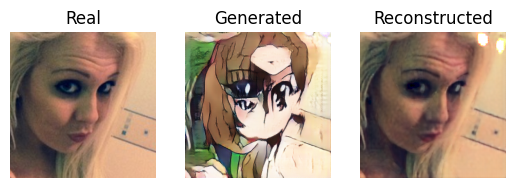

1/1 [==============================] - 0s 13ms/step


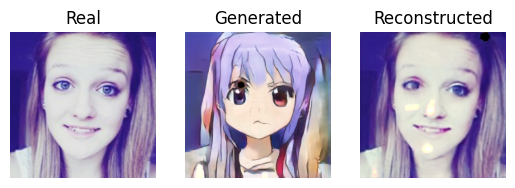

1/1 [==============================] - 0s 12ms/step


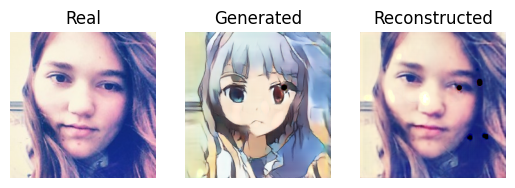

1/1 [==============================] - 0s 13ms/step


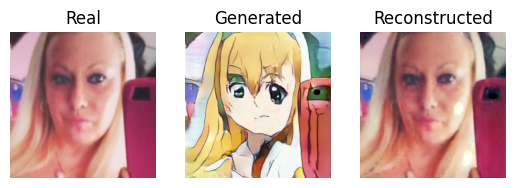

1/1 [==============================] - 0s 17ms/step


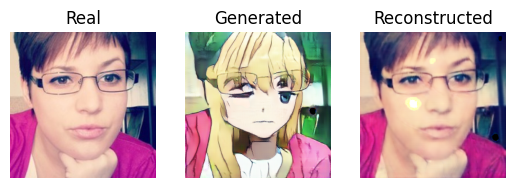

1/1 [==============================] - 0s 13ms/step


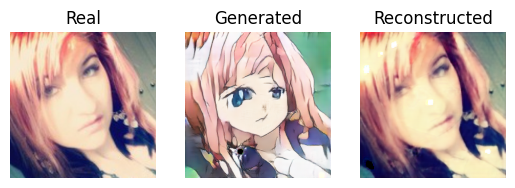

1/1 [==============================] - 0s 12ms/step


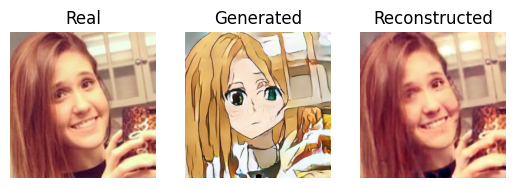

1/1 [==============================] - 0s 18ms/step


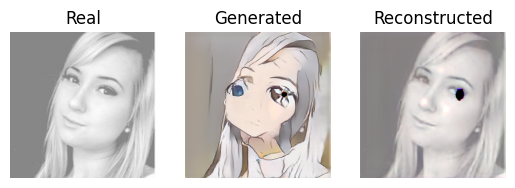

1/1 [==============================] - 0s 12ms/step


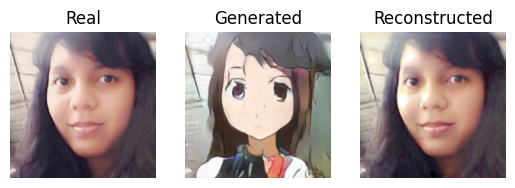

1/1 [==============================] - 0s 11ms/step


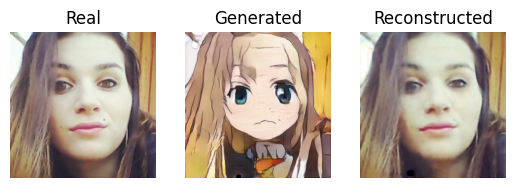

1/1 [==============================] - 0s 13ms/step


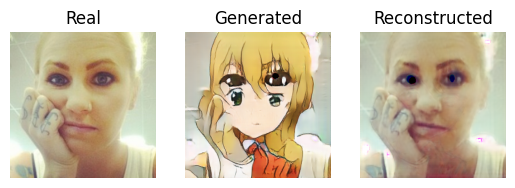

1/1 [==============================] - 0s 13ms/step


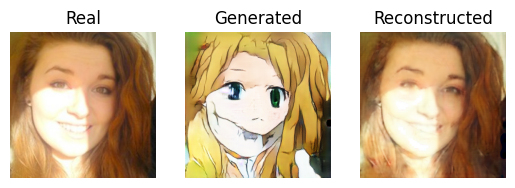

1/1 [==============================] - 0s 12ms/step


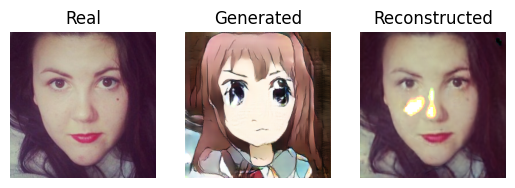

1/1 [==============================] - 0s 15ms/step


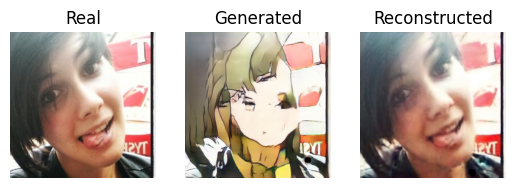

1/1 [==============================] - 0s 12ms/step


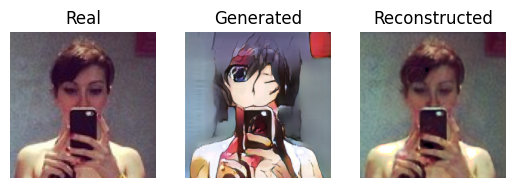

1/1 [==============================] - 0s 13ms/step


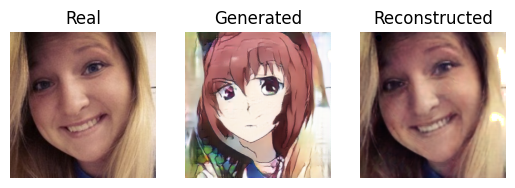

1/1 [==============================] - 0s 14ms/step


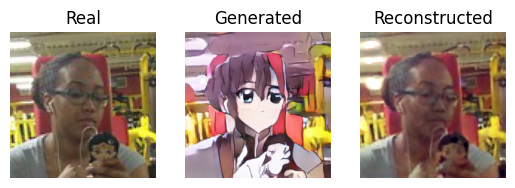

1/1 [==============================] - 0s 17ms/step


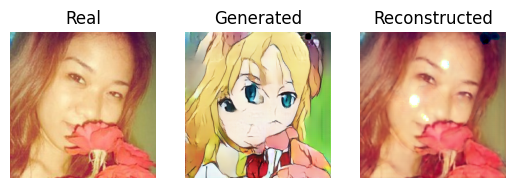

1/1 [==============================] - 0s 12ms/step


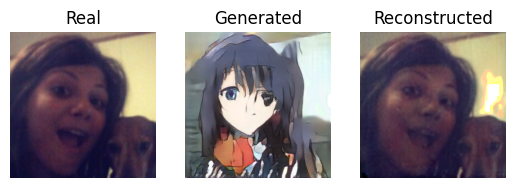

1/1 [==============================] - 0s 24ms/step


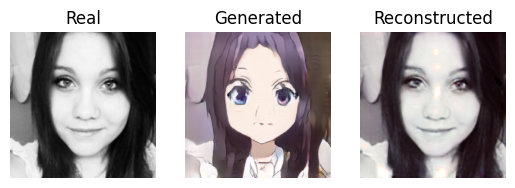

1/1 [==============================] - 0s 13ms/step


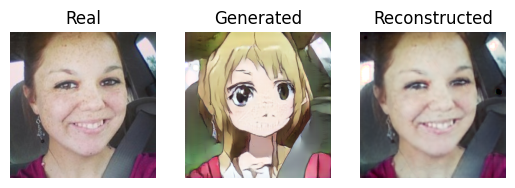

1/1 [==============================] - 0s 13ms/step


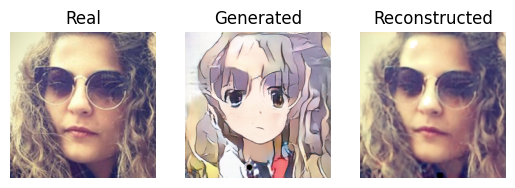

1/1 [==============================] - 0s 86ms/step


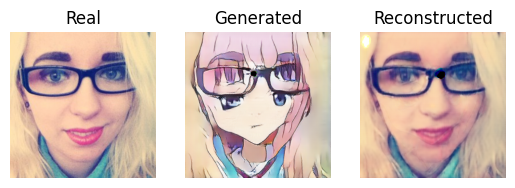

1/1 [==============================] - 0s 54ms/step


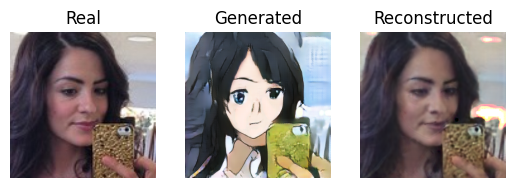

1/1 [==============================] - 0s 12ms/step


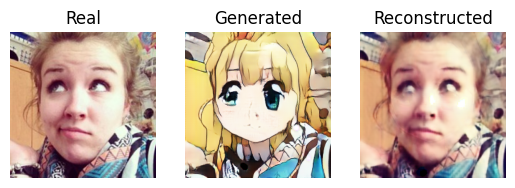

1/1 [==============================] - 0s 13ms/step


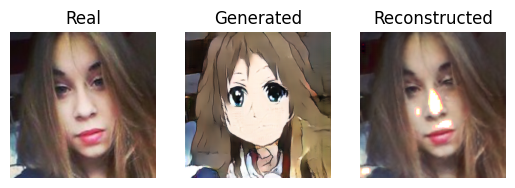

1/1 [==============================] - 0s 13ms/step


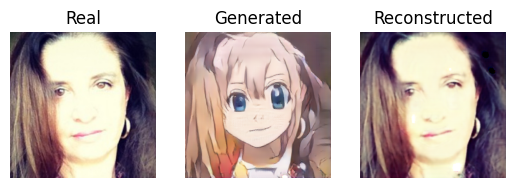

1/1 [==============================] - 0s 12ms/step


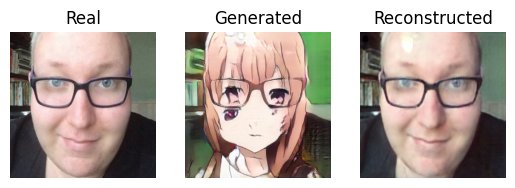

1/1 [==============================] - 0s 13ms/step


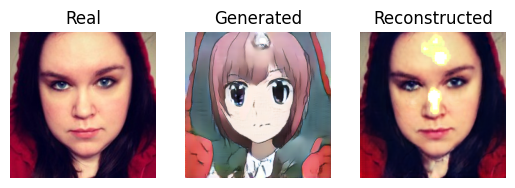

1/1 [==============================] - 0s 20ms/step


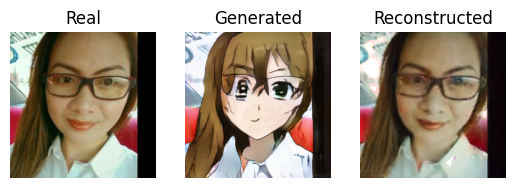

1/1 [==============================] - 0s 23ms/step


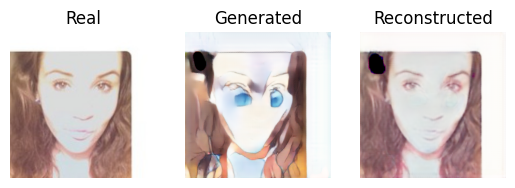

1/1 [==============================] - 0s 13ms/step


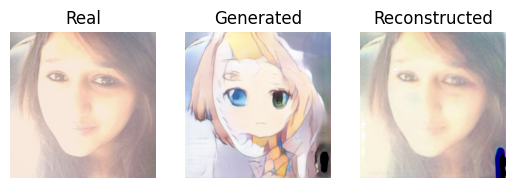

1/1 [==============================] - 0s 12ms/step


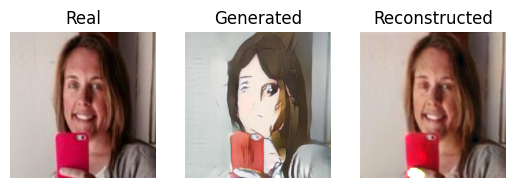

1/1 [==============================] - 0s 13ms/step


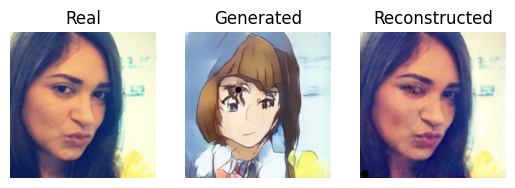

1/1 [==============================] - 0s 13ms/step


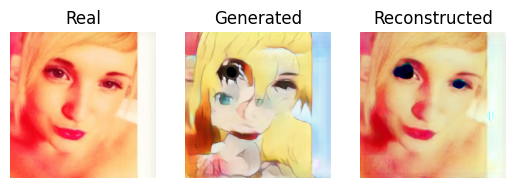

1/1 [==============================] - 0s 19ms/step


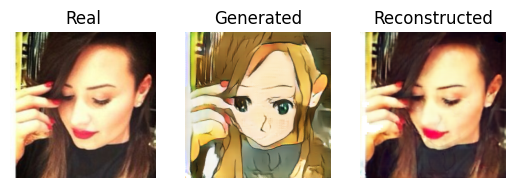

1/1 [==============================] - 0s 12ms/step


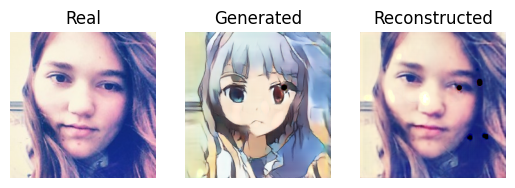

1/1 [==============================] - 0s 12ms/step


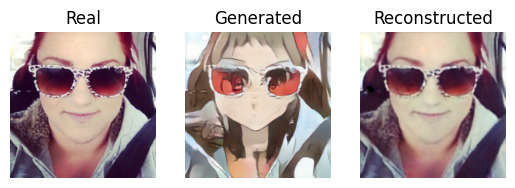

1/1 [==============================] - 0s 15ms/step


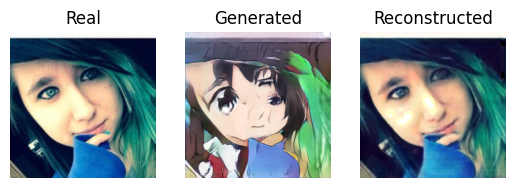

1/1 [==============================] - 0s 27ms/step


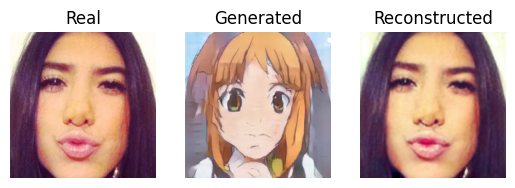

1/1 [==============================] - 0s 14ms/step


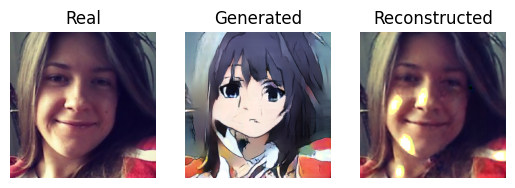

1/1 [==============================] - 0s 13ms/step


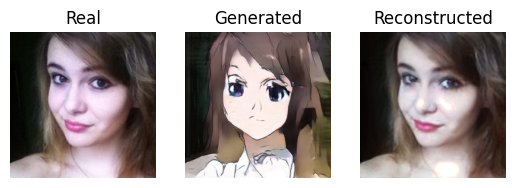

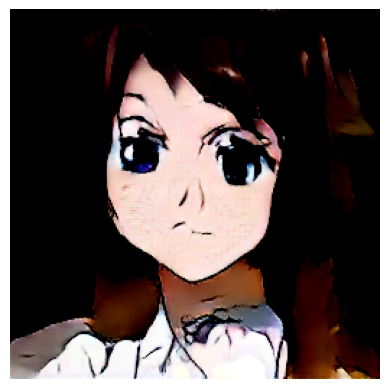

In [108]:
import os
from skimage import util
import matplotlib.pyplot as plt

def save_image(image, filename):
    # 將圖像轉換為8位元無符號整數
    image = util.img_as_ubyte(image)
    # 將圖像顯示在軸上
    plt.imshow(image)
    # 關閉軸
    plt.axis("off")
    # 儲存圖像
    plt.imsave(filename, image)

# 創建儲存圖像的文件夾
os.makedirs("real_images", exist_ok=True)
os.makedirs("generated_images", exist_ok=True)

for i in range(0, 100):
    # Plot A->B->A
    A_real = select_sample(A_data, 1)
    B_generated = model_AtoB.predict(A_real)
    A_reconstructed = model_BtoA.predict(B_generated)

    # Plot A->B->A with SSIM value
    show_plot(A_real, B_generated, A_reconstructed)

    # 儲存真實圖像和生成圖像
    save_image(A_real[0], f"real_images/real_image{i}.png")
    save_image(B_generated[0], f"generated_images/generated_image{i}.png")


In [144]:
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np
from scipy import linalg

def load_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_image(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, (299, 299))
    return image

def preprocess_images(images):
    preprocessed_images = []
    for image in images:
        preprocessed_image = (image - 0.5) * 2.0  # 正規化到 [-1, 1] 範圍
        preprocessed_images.append(preprocessed_image)
    return preprocessed_images

def calculate_activation_statistics(images, model):
    preprocessed_images = preprocess_images(images)
    activations = model(preprocessed_images)
    mu = np.mean(activations, axis=0)
    sigma = np.cov(activations, rowvar=False)
    return mu, sigma

def calculate_frechet_distance(mu1, sigma1, mu2, sigma2):
    diff = mu1 - mu2
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if not np.isfinite(covmean).all():
        covmean = np.identity(sigma1.shape[0])
    score = np.dot(diff, diff) + np.trace(sigma1) + np.trace(sigma2) - 2 * np.trace(covmean)
    return score

def calculate_fid_score(real_images, generated_images, batch_size):
    module = hub.load("https://tfhub.dev/google/imagenet/inception_v3/feature_vector/5")
    num_batches = len(real_images) // batch_size
    
    fid_scores = []
    
    for i in range(num_batches):
        start_idx = i * batch_size
        end_idx = start_idx + batch_size
        
        real_batch = real_images[start_idx:end_idx]
        generated_batch = generated_images[start_idx:end_idx]
        
        mu_real, sigma_real = calculate_activation_statistics(real_batch, module)
        mu_generated, sigma_generated = calculate_activation_statistics(generated_batch, module)
        
        fid_score = calculate_frechet_distance(mu_real, sigma_real, mu_generated, sigma_generated)
        fid_scores.append(fid_score)
    
    return np.mean(fid_scores)

# 載入真實圖像和生成圖像
real_images = []
generated_images = []
for i in range(1, 101):
    real_image_path = f"real_images/real_image{i}.png"
    generated_image_path = f"generated_images/generated_image{i}.png"
    real_image = load_image(real_image_path)
    generated_image = load_image(generated_image_path)
    real_images.append(real_image)
    generated_images.append(generated_image)

# 設定批次大小
batch_size = 10

# 計算 FID 分數
fid = calculate_fid_score(real_images, real_images, batch_size)
fid = fid.real
print('FID (same):%.3f'% fid)

fid_score = calculate_fid_score(real_images, generated_images, batch_size)
fid_score_real = fid_score.real
print('self2anmie FID Score:%.3f'% fid_score_real)


FID (same):-0.000
self2anmie FID Score:202.635
